In [1]:
# !pip install autokeras


In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf

import logging
logging.getLogger('tensorflow').disabled = True

from sklearn.datasets import fetch_california_housing
import autokeras as ak

import plotly.express as px
import copy 
import os
import json

from mylib import plot_roc, plot_pr_curve, plot_roc_train_test, plot_pr_train_test, hyper_table, predic_error_analysis, plot_pr_multi_class

## A Simple Example
The first step is to prepare your data. Here we use the [California housing
dataset](
https://scikit-learn.org/stable/datasets/index.html#california-housing-dataset)
as an example.


In [3]:
house_dataset = fetch_california_housing()
df = pd.DataFrame(
    np.concatenate(
        (house_dataset.data, house_dataset.target.reshape(-1, 1)), axis=1
    ),
    columns=house_dataset.feature_names + ["Price"],
)
train_size = int(df.shape[0] * 0.9)
df[:train_size].to_csv("train.csv", index=False)
df[train_size:].to_csv("eval.csv", index=False)
train_file_path = "train.csv"
test_file_path = "eval.csv"

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


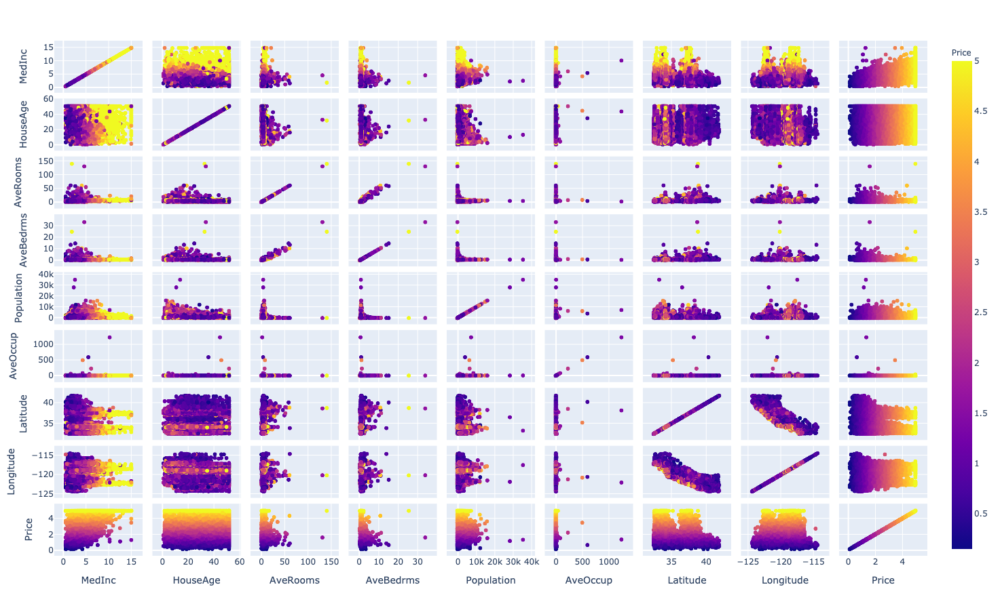

In [4]:
display(df)
features = list(df.columns)
fig = px.scatter_matrix(df, dimensions=features, color="Price")
fig.update_traces(diagonal_visible=True)
fig.update_layout(width=1200, height=900)
fig.show()

The second step is to run the
[StructuredDataRegressor](/structured_data_regressor).
As a quick demo, we set epochs to 10.
You can also leave the epochs unspecified for an adaptive number of epochs.


In [5]:
# Initialize the structured data regressor.
reg = ak.StructuredDataRegressor(
    overwrite=True, max_trials=3
)  # It tries 3 different models.
# Feed the structured data regressor with training data.
reg.fit(
    # The path to the train.csv file.
    train_file_path,
    # The name of the label column.
    "Price",
    epochs=10,
)
# Predict with the best model.
predicted_y = reg.predict(test_file_path)
# Evaluate the best model with testing data.
print(reg.evaluate(test_file_path, "Price"))

display(hyper_table(path='structured_data_regressor'))

Trial 3 Complete [00h 00m 08s]
val_loss: 0.7645198702812195

Best val_loss So Far: 0.7645198702812195
Total elapsed time: 00h 00m 23s
Epoch 1/10
581/581 [==============================] - 1s 1ms/step - loss: 1.0746 - mean_squared_error: 1.0746
Epoch 2/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4718 - mean_squared_error: 0.4718
Epoch 3/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4379 - mean_squared_error: 0.4379
Epoch 4/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4251 - mean_squared_error: 0.4251
Epoch 5/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4181 - mean_squared_error: 0.4181
Epoch 6/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4148 - mean_squared_error: 0.4148
Epoch 7/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4163 - mean_squared_error: 0.4163
Epoch 8/10
581/581 [==============================] - 1s 1ms/step - loss: 0.4067 - mean_squared_

,trial#1,trial#2,trial#3
structured_data_block_1/normalize,True,True,True
structured_data_block_1/dense_block_1/use_batchnorm,False,False,False
structured_data_block_1/dense_block_1/num_layers,2,2,2
structured_data_block_1/dense_block_1/units_0,32,32,512
structured_data_block_1/dense_block_1/dropout,0,0,0
structured_data_block_1/dense_block_1/units_1,32,32,32
regression_head_1/dropout,0,0,0
optimizer,adam,adam,adam
learning_rate,0.001,0.001,0.001
score,0.895826,0.927352,0.76452


In [ ]:
# x_train as pandas.DataFrame, y_train as pandas.Series
x_train = pd.read_csv(train_file_path)
#print(type(x_train))  # pandas.DataFrame
y_train = x_train.pop("Price")
#print(type(y_train))  # pandas.Series

# Preparing testing data.
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 8)]               0         
_________________________________________________________________
multi_category_encoding (Mul (None, 8)                 0         
_________________________________________________________________
normalization (Normalization (None, 8)                 17        
_________________________________________________________________
dense (Dense)                (None, 512)               4608      
_________________________________________________________________
re_lu (ReLU)                 (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                16416     
_________________________________________________________________
re_lu_1 (ReLU)               (None, 32)                0     

## Data Format
The AutoKeras StructuredDataRegressor is quite flexible for the data format.

The example above shows how to use the CSV files directly. Besides CSV files,
it also supports numpy.ndarray, pandas.DataFrame or [tf.data.Dataset](
https://www.tensorflow.org/api_docs/python/tf/data/Dataset?version=stable). The
data should be two-dimensional with numerical or categorical values.

For the regression targets, it should be a vector of numerical values.
AutoKeras accepts numpy.ndarray, pandas.DataFrame, or pandas.Series.

The following examples show how the data can be prepared with numpy.ndarray,
pandas.DataFrame, and tensorflow.data.Dataset.


In [ ]:

# x_train as pandas.DataFrame, y_train as pandas.Series
x_train = pd.read_csv(train_file_path)
print(type(x_train))  # pandas.DataFrame
y_train = x_train.pop("Price")
print(type(y_train))  # pandas.Series

# You can also use pandas.DataFrame for y_train.
y_train = pd.DataFrame(y_train)
print(type(y_train))  # pandas.DataFrame

# You can also use numpy.ndarray for x_train and y_train.
x_train = x_train.to_numpy()
y_train = y_train.to_numpy()
print(type(x_train))  # numpy.ndarray
print(type(y_train))  # numpy.ndarray

# Preparing testing data.
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

# It tries 10 different models.
reg = ak.StructuredDataRegressor(max_trials=3, overwrite=True)
# Feed the structured data regressor with training data.
reg.fit(x_train, y_train, epochs=10)
# Predict with the best model.
predicted_y = reg.predict(x_test)
# Evaluate the best model with testing data.
print(reg.evaluate(x_test, y_test))

# performance of the model
display(hyper_table(path='structured_data_regressor'))
x_train = pd.read_csv(train_file_path)
y_train = x_train.pop("Price")
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

The following code shows how to convert numpy.ndarray to tf.data.Dataset.


In [ ]:
train_set = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_set = tf.data.Dataset.from_tensor_slices((x_test, y_test))

reg = ak.StructuredDataRegressor(max_trials=3, overwrite=True)
# Feed the tensorflow Dataset to the regressor.
reg.fit(train_set, epochs=10)
# Predict with the best model.
predicted_y = reg.predict(test_set)
# Evaluate the best model with testing data.
print(reg.evaluate(test_set))


# performance of the model
display(hyper_table(path='structured_data_regressor'))
x_train = pd.read_csv(train_file_path)
y_train = x_train.pop("Price")
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

You can also specify the column names and types for the data as follows.  The
`column_names` is optional if the training data already have the column names,
e.g.  pandas.DataFrame, CSV file.  Any column, whose type is not specified will
be inferred from the training data.


In [ ]:
# Initialize the structured data regressor.
reg = ak.StructuredDataRegressor(
    column_names=[
        "MedInc",
        "HouseAge",
        "AveRooms",
        "AveBedrms",
        "Population",
        "AveOccup",
        "Latitude",
        "Longitude",
    ],
    column_types={"MedInc": "numerical", "Latitude": "numerical"},
    max_trials=10,  # It tries 10 different models.
    overwrite=True,
)



## Validation Data
By default, AutoKeras use the last 20% of training data as validation data.  As
shown in the example below, you can use `validation_split` to specify the
percentage.


In [ ]:
reg.fit(
    x_train,
    y_train,
    # Split the training data and use the last 15% as validation data.
    validation_split=0.15,
    epochs=10,
)


# performance of the model
display(hyper_table(path='structured_data_regressor'))
x_train = pd.read_csv(train_file_path)
y_train = x_train.pop("Price")
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

You can also use your own validation set
instead of splitting it from the training data with `validation_data`.


In [ ]:
split = 500
x_val = x_train[split:]
y_val = y_train[split:]
x_train = x_train[:split]
y_train = y_train[:split]
reg.fit(
    x_train,
    y_train,
    # Use your own validation set.
    validation_data=(x_val, y_val),
    epochs=10,
)


## Customized Search Space
For advanced users, you may customize your search space by using
[AutoModel](/auto_model/#automodel-class) instead of
[StructuredDataRegressor](/structured_data_regressor). You can configure the
[StructuredDataBlock](/block/#structureddatablock-class) for some high-level
configurations, e.g., `categorical_encoding` for whether to use the
[CategoricalToNumerical](/block/#categoricaltonumerical-class). You can also do
not specify these arguments, which would leave the different choices to be
tuned automatically. See the following example for detail.


In [ ]:
input_node = ak.StructuredDataInput()
output_node = ak.StructuredDataBlock(categorical_encoding=True)(input_node)
output_node = ak.RegressionHead()(output_node)
reg = ak.AutoModel(
    inputs=input_node, outputs=output_node, overwrite=True, max_trials=3
)
reg.fit(x_train, y_train, epochs=10)

# performance of the model
display(hyper_table(path='auto_model'))

x_train = pd.read_csv(train_file_path)
y_train = x_train.pop("Price")
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

The usage of [AutoModel](/auto_model/#automodel-class) is similar to the
[functional API](https://www.tensorflow.org/guide/keras/functional) of Keras.
Basically, you are building a graph, whose edges are blocks and the nodes are
intermediate outputs of blocks.  To add an edge from `input_node` to
`output_node` with `output_node = ak.[some_block]([block_args])(input_node)`.

You can even also use more fine grained blocks to customize the search space
even further. See the following example.


In [ ]:
input_node = ak.StructuredDataInput()
output_node = ak.CategoricalToNumerical()(input_node)
output_node = ak.DenseBlock()(output_node)
output_node = ak.RegressionHead()(output_node)
reg = ak.AutoModel(
    inputs=input_node, outputs=output_node, max_trials=3, overwrite=True
)
reg.fit(x_train, y_train, epochs=10)

# performance of the model
display(hyper_table(path='auto_model'))
x_train = pd.read_csv(train_file_path)
y_train = x_train.pop("Price")
x_test = pd.read_csv(test_file_path)
y_test = x_test.pop("Price")

model = reg.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

predic_error_analysis(x_train, y_train, y_score_train, x_test, y_test, y_score)

You can also export the best model found by AutoKeras as a Keras Model.


In [ ]:
model = reg.export_model()
model.summary()
# numpy array in object (mixed type) is not supported.
# you need convert it to unicode or float first.
y_predict = model.predict(x_train)

## Reference
[StructuredDataRegressor](/structured_data_regressor),
[AutoModel](/auto_model/#automodel-class),
[StructuredDataBlock](/block/#structureddatablock-class),
[DenseBlock](/block/#denseblock-class),
[StructuredDataInput](/node/#structureddatainput-class),
[RegressionHead](/block/#regressionhead-class),
[CategoricalToNumerical](/block/#categoricaltonumerical-class).
